<a href="https://colab.research.google.com/github/Adityakushwaha2006/Quidich-Hackenza-2025-CSIS/blob/main/Quidich_iter2_Adityakush.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Install required packages
!pip install mediapipe
!pip install opencv-python
!pip install numpy
!pip install matplotlib
!pip install open3d
!pip install deep-sort-realtime

In [10]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Define paths to the Quidich folder and its contents
base_path = "/content/drive/My Drive/Quidich-HACKATHON-25"
im_233_path = f"{base_path}/233_im"
im_235_path = f"{base_path}/235_im"
rotation_vectors_path = f"{base_path}/extrinsic.json"
camera_matrix_path = f"{base_path}/intrinsic.json"


Mounted at /content/drive


In [12]:
# Verify paths and list files
print("Files in 233_im:")
!ls "{im_233_path}"

print("Files in 235_im:")
!ls "{im_235_path}"

# Install necessary libraries
!pip install mediapipe open3d numpy

# Import libraries
import os
import cv2
import mediapipe as mp
import numpy as np
import open3d as o3d
import json

# Load rotation vectors and camera calibration data
with open(rotation_vectors_path, 'r') as f:
    extrinsic_data = json.load(f)
with open(camera_matrix_path, 'r') as f:
    intrinsic_data = json.load(f)

# MediaPipe Pose setup
mp_pose = mp.solutions.pose

def detect_pose(image):
    """Detect pose landmarks in an image using MediaPipe."""
    with mp_pose.Pose(static_image_mode=True) as pose:
        results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        if results.pose_landmarks:
            return results.pose_landmarks.landmark
        return None

def reconstruct_3d_pose(landmarks_233, landmarks_235):
    """Reconstruct 3D joint locations from two views."""
    joint_locations = []
    for lm1, lm2 in zip(landmarks_233, landmarks_235):
        x = (lm1.x + lm2.x) / 2
        y = (lm1.y + lm2.y) / 2
        z = abs(lm1.z - lm2.z)  # Use difference in z as depth approximation
        joint_locations.append([x, y, z])
    return np.array(joint_locations)

def visualize_3d_pose(joint_locations):
    """Visualize 3D pose using Open3D."""
    point_cloud = o3d.geometry.PointCloud()
    point_cloud.points = o3d.utility.Vector3dVector(joint_locations)
    o3d.visualization.draw_geometries([point_cloud], zoom=0.5)

def process_frame(frame_id):
    """Process a single frame."""
    # Construct file paths for images
    img_233_path = os.path.join(im_233_path, f"frame{frame_id}.jpg")
    img_235_path = os.path.join(im_235_path, f"frame{frame_id}.jpg")

    # Load images
    img_233 = cv2.imread(img_233_path)
    img_235 = cv2.imread(img_235_path)

    # Check if images are loaded correctly
    if img_233 is None:
        print(f"Image not found: {img_233_path}")
        return None
    if img_235 is None:
        print(f"Image not found: {img_235_path}")
        return None

    # Detect pose landmarks (MediaPipe)
    landmarks_233 = detect_pose(img_233)
    landmarks_235 = detect_pose(img_235)

    if not landmarks_233 or not landmarks_235:
        print(f"Pose not detected in frame {frame_id}")
        return None

    # Reconstruct and visualize 3D pose
    joint_locations = reconstruct_3d_pose(landmarks_233, landmarks_235)
    visualize_3d_pose(joint_locations)

# Process frames one by one (example)
frames = list(range(1, 507))  # Assuming frames are numbered sequentially from 1 to 506.
for frame_id in frames[:10]:  # Process only first 10 frames for testing
    process_frame(frame_id)

print("Processing complete!")

Files in 233_im:
HPUP_033_1_1_1_L_CAM-05_0000001.jpeg  HPUP_033_1_1_1_L_CAM-05_0000254.jpeg
HPUP_033_1_1_1_L_CAM-05_0000002.jpeg  HPUP_033_1_1_1_L_CAM-05_0000255.jpeg
HPUP_033_1_1_1_L_CAM-05_0000003.jpeg  HPUP_033_1_1_1_L_CAM-05_0000256.jpeg
HPUP_033_1_1_1_L_CAM-05_0000004.jpeg  HPUP_033_1_1_1_L_CAM-05_0000257.jpeg
HPUP_033_1_1_1_L_CAM-05_0000005.jpeg  HPUP_033_1_1_1_L_CAM-05_0000258.jpeg
HPUP_033_1_1_1_L_CAM-05_0000006.jpeg  HPUP_033_1_1_1_L_CAM-05_0000259.jpeg
HPUP_033_1_1_1_L_CAM-05_0000007.jpeg  HPUP_033_1_1_1_L_CAM-05_0000260.jpeg
HPUP_033_1_1_1_L_CAM-05_0000008.jpeg  HPUP_033_1_1_1_L_CAM-05_0000261.jpeg
HPUP_033_1_1_1_L_CAM-05_0000009.jpeg  HPUP_033_1_1_1_L_CAM-05_0000262.jpeg
HPUP_033_1_1_1_L_CAM-05_0000010.jpeg  HPUP_033_1_1_1_L_CAM-05_0000263.jpeg
HPUP_033_1_1_1_L_CAM-05_0000011.jpeg  HPUP_033_1_1_1_L_CAM-05_0000264.jpeg
HPUP_033_1_1_1_L_CAM-05_0000012.jpeg  HPUP_033_1_1_1_L_CAM-05_0000265.jpeg
HPUP_033_1_1_1_L_CAM-05_0000013.jpeg  HPUP_033_1_1_1_L_CAM-05_0000266.jpeg
HPUP_033

In [13]:
# Verify paths and list files
print("Files in 233_im:")
!ls "{im_233_path}"

print("Files in 235_im:")
!ls "{im_235_path}"

# Install necessary libraries
!pip install mediapipe open3d numpy

# Import libraries
import os
import cv2
import mediapipe as mp
import numpy as np
import open3d as o3d
import json

# Load rotation vectors and camera calibration data
with open(rotation_vectors_path, 'r') as f:
    extrinsic_data = json.load(f)
with open(camera_matrix_path, 'r') as f:
    intrinsic_data = json.load(f)

# MediaPipe Pose setup
mp_pose = mp.solutions.pose

def detect_pose(image):
    """Detect pose landmarks in an image using MediaPipe."""
    with mp_pose.Pose(static_image_mode=True) as pose:
        results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        if results.pose_landmarks:
            return results.pose_landmarks.landmark
        return None

def reconstruct_3d_pose(landmarks_233, landmarks_235):
    """Reconstruct 3D joint locations from two views."""
    joint_locations = []
    for lm1, lm2 in zip(landmarks_233, landmarks_235):
        x = (lm1.x + lm2.x) / 2
        y = (lm1.y + lm2.y) / 2
        z = abs(lm1.z - lm2.z)  # Use difference in z as depth approximation
        joint_locations.append([x, y, z])
    return np.array(joint_locations)

def visualize_3d_pose(joint_locations):
    """Visualize 3D pose using Open3D."""
    point_cloud = o3d.geometry.PointCloud()
    point_cloud.points = o3d.utility.Vector3dVector(joint_locations)
    o3d.visualization.draw_geometries([point_cloud], zoom=0.5)

def process_frame(frame_id):
    """Process a single frame."""
    # Construct file paths for images
    img_233_path = os.path.join(im_233_path, f"frame{frame_id}.jpg")
    img_235_path = os.path.join(im_235_path, f"frame{frame_id}.jpg")

    # Load images
    img_233 = cv2.imread(img_233_path)
    img_235 = cv2.imread(img_235_path)

    # Check if images are loaded correctly
    if img_233 is None:
        print(f"Image not found: {img_233_path}")
        return None
    if img_235 is None:
        print(f"Image not found: {img_235_path}")
        return None

    # Detect pose landmarks (MediaPipe)
    landmarks_233 = detect_pose(img_233)
    landmarks_235 = detect_pose(img_235)

    if not landmarks_233 or not landmarks_235:
        print(f"Pose not detected in frame {frame_id}")
        return None

    # Reconstruct and visualize 3D pose
    joint_locations = reconstruct_3d_pose(landmarks_233, landmarks_235)
    visualize_3d_pose(joint_locations)

# Process frames one by one (example)
frames = list(range(1, 507))  # Assuming frames are numbered sequentially from 1 to 506.
for frame_id in frames[:10]:  # Process only first 10 frames for testing
    process_frame(frame_id)

print("Processing complete!")

Files in 233_im:
HPUP_033_1_1_1_L_CAM-05_0000001.jpeg  HPUP_033_1_1_1_L_CAM-05_0000254.jpeg
HPUP_033_1_1_1_L_CAM-05_0000002.jpeg  HPUP_033_1_1_1_L_CAM-05_0000255.jpeg
HPUP_033_1_1_1_L_CAM-05_0000003.jpeg  HPUP_033_1_1_1_L_CAM-05_0000256.jpeg
HPUP_033_1_1_1_L_CAM-05_0000004.jpeg  HPUP_033_1_1_1_L_CAM-05_0000257.jpeg
HPUP_033_1_1_1_L_CAM-05_0000005.jpeg  HPUP_033_1_1_1_L_CAM-05_0000258.jpeg
HPUP_033_1_1_1_L_CAM-05_0000006.jpeg  HPUP_033_1_1_1_L_CAM-05_0000259.jpeg
HPUP_033_1_1_1_L_CAM-05_0000007.jpeg  HPUP_033_1_1_1_L_CAM-05_0000260.jpeg
HPUP_033_1_1_1_L_CAM-05_0000008.jpeg  HPUP_033_1_1_1_L_CAM-05_0000261.jpeg
HPUP_033_1_1_1_L_CAM-05_0000009.jpeg  HPUP_033_1_1_1_L_CAM-05_0000262.jpeg
HPUP_033_1_1_1_L_CAM-05_0000010.jpeg  HPUP_033_1_1_1_L_CAM-05_0000263.jpeg
HPUP_033_1_1_1_L_CAM-05_0000011.jpeg  HPUP_033_1_1_1_L_CAM-05_0000264.jpeg
HPUP_033_1_1_1_L_CAM-05_0000012.jpeg  HPUP_033_1_1_1_L_CAM-05_0000265.jpeg
HPUP_033_1_1_1_L_CAM-05_0000013.jpeg  HPUP_033_1_1_1_L_CAM-05_0000266.jpeg
HPUP_033

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Frame 1: Joint Segmentation


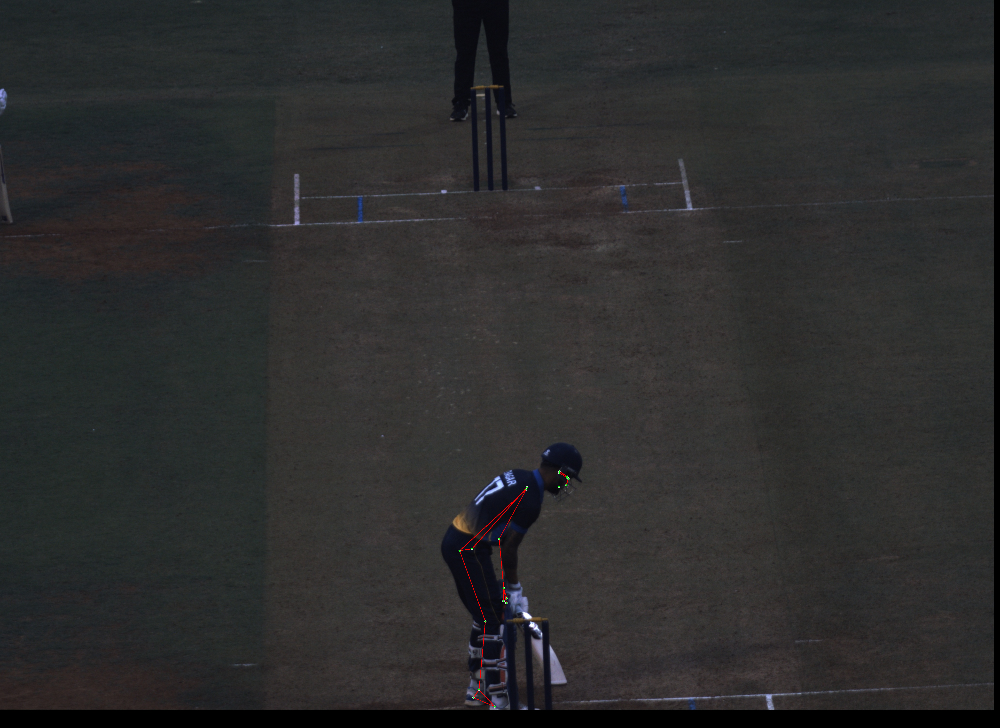

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define base path for the shared folder shortcut
base_path = "/content/drive/My Drive/Quidich-HACKATHON-25"
im_233_path = f"{base_path}/233_im"
im_235_path = f"{base_path}/235_im"
rotation_vectors_path = f"{base_path}/extrinsic.json"
camera_matrix_path = f"{base_path}/intrinsic.json"

# Install necessary libraries
!pip install mediapipe open3d numpy

# Import libraries
import os
import cv2
import mediapipe as mp
import numpy as np
import open3d as o3d
from google.colab.patches import cv2_imshow
import json

# Load rotation vectors and camera calibration data
with open(rotation_vectors_path, 'r') as f:
    extrinsic_data = json.load(f)
with open(camera_matrix_path, 'r') as f:
    intrinsic_data = json.load(f)

# MediaPipe Pose setup
mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils

def detect_pose(image):
    """Detect pose landmarks in an image using MediaPipe."""
    with mp_pose.Pose(static_image_mode=True) as pose:
        results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        if results.pose_landmarks:
            return results.pose_landmarks.landmark, results.pose_landmarks
        return None, None

def reconstruct_3d_pose(landmarks_233, landmarks_235):
    """Reconstruct 3D joint locations from two views."""
    joint_locations = []
    for lm1, lm2 in zip(landmarks_233, landmarks_235):
        x = (lm1.x + lm2.x) / 2
        y = (lm1.y + lm2.y) / 2
        z = abs(lm1.z - lm2.z)  # Use difference in z as depth approximation
        joint_locations.append([x, y, z])
    return np.array(joint_locations)

def visualize_3d_pose(joint_locations, frame_id):
    """Visualize 3D pose using Open3D."""
    point_cloud = o3d.geometry.PointCloud()
    point_cloud.points = o3d.utility.Vector3dVector(joint_locations)

    # Save visualization as an image since Open3D GUI doesn't work in Colab
    vis = o3d.visualization.Visualizer()
    vis.create_window(visible=False)
    vis.add_geometry(point_cloud)
    vis.update_geometry(point_cloud)
    vis.poll_events()
    vis.update_renderer()
    vis.capture_screen_image(f"frame_{frame_id}_3d.png")
    vis.destroy_window()

def process_frame(frame_id):
    """Process a single frame."""
    # Construct file paths for images
    img_233_path = os.path.join(im_233_path, f"HPUP_033_1_1_1_L_CAM-05_{frame_id:07d}.jpeg")
    img_235_path = os.path.join(im_235_path, f"HPUP_033_1_1_1_L_CAM-02_{frame_id:07d}.jpeg")

    # Load images
    img_233 = cv2.imread(img_233_path)
    img_235 = cv2.imread(img_235_path)

    # Check if images are loaded correctly
    if img_233 is None:
        print(f"Image not found: {img_233_path}")
        return None
    if img_235 is None:
        print(f"Image not found: {img_235_path}")
        return None

    # Detect pose landmarks (MediaPipe)
    landmarks_233, pose_landmarks_233 = detect_pose(img_233)
    landmarks_235, pose_landmarks_235 = detect_pose(img_235)

    if not landmarks_233 or not landmarks_235:
        print(f"Pose not detected in frame {frame_id}")
        return None

    # Draw pose landmarks on images for visualization
    annotated_img_233 = img_233.copy()
    mp_drawing.draw_landmarks(
        annotated_img_233,
        pose_landmarks_233,
        mp_pose.POSE_CONNECTIONS,
        mp_drawing.DrawingSpec(color=(0, 255, 0), thickness=2, circle_radius=2),
        mp_drawing.DrawingSpec(color=(0, 0, 255), thickness=2, circle_radius=2),
    )

    annotated_img_235 = img_235.copy()
    mp_drawing.draw_landmarks(
        annotated_img_235,
        pose_landmarks_235,
        mp_pose.POSE_CONNECTIONS,
        mp_drawing.DrawingSpec(color=(0, 255, 0), thickness=2, circle_radius=2),
        mp_drawing.DrawingSpec(color=(0, 0, 255), thickness=2, circle_radius=2),
    )

    # Display annotated images with joint segmentation
    print(f"Frame {frame_id}: Joint Segmentation")
    cv2_imshow(annotated_img_233)
    cv2_imshow(annotated_img_235)

    # Reconstruct and visualize 3D pose
    joint_locations = reconstruct_3d_pose(landmarks_233, landmarks_235)

    print(f"Frame {frame_id}: Saving 3D Reconstruction...")
    visualize_3d_pose(joint_locations, frame_id)

# Process frames one by one (example: first 10 frames)
frames = list(range(1, 11))  # Adjust range as needed (e.g., range(1, 507) for all frames)
for frame_id in frames:
    process_frame(frame_id)

print("Processing complete!")
